In [1]:
# Import libraries needed (OpenCV to train the image)
import cv2

In [2]:
# Check opencv's version
cv2.__version__

'3.4.4'

In [3]:
# (import numpy to use array, and pyplot to visualize plotting)
import numpy as np
import matplotlib.pyplot as plt

In [4]:
# Read the images that we want to stitch together to create a panorama
img_right = cv2.imread('img_right.jpg')
img_left = cv2.imread('img_left.jpg')

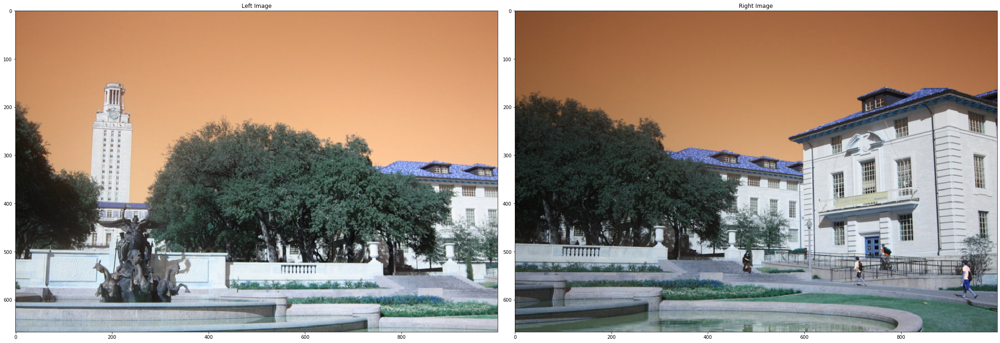

In [5]:
# Display the left and right images
# Color that is read by openCV is in reverse order, which is BGR
plt.figure(figsize=(30,20))
plt.subplot(1,2,1)
plt.title("Left Image")
plt.imshow(img_left)
plt.subplot(1,2,2)
plt.title("Right Image")
plt.imshow(img_right)
plt.tight_layout()

In [12]:
# Function to fix the color from BGR to RGB
def fixColor(image):
    return(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

In [13]:
# Convert the images into grayscale format
img1 = cv2.cvtColor(img_right, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor( img_left , cv2.COLOR_BGR2GRAY)

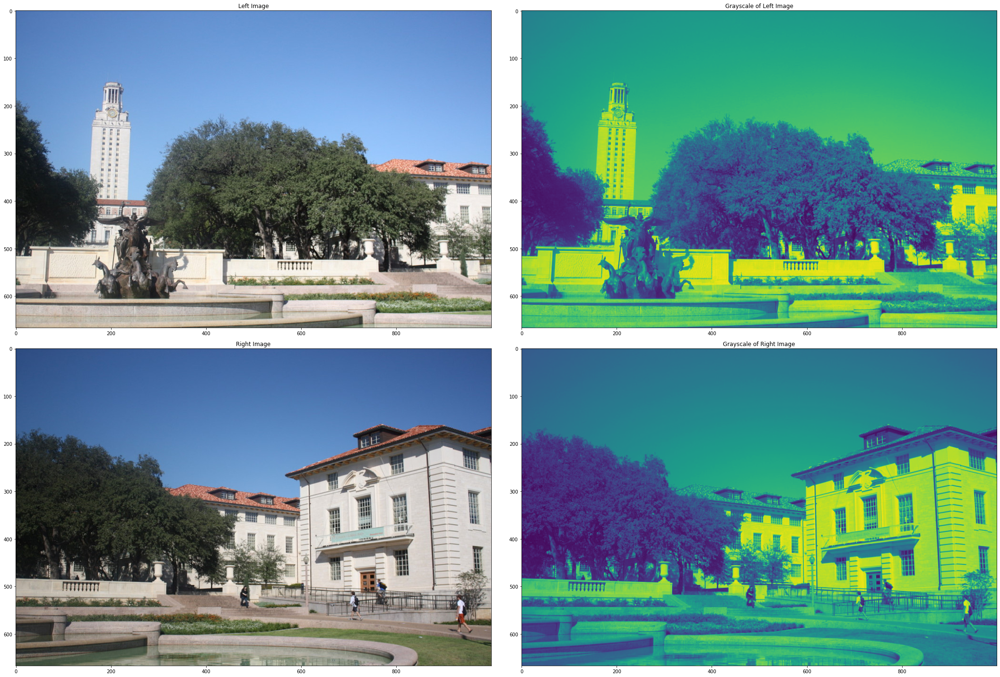

In [14]:
# Display the converted Grayscales and RGB images
plt.figure(figsize=(30,20))

# RGB of "Left Image"
plt.subplot(2,2,1)
plt.title("Left Image")
plt.imshow(fixColor(img_left))

#Grayscale of "Left Image"
plt.subplot(2,2,2)
plt.title("Grayscale of Left Image")
plt.imshow(img2)

# RGB of "Right Image"
plt.subplot(2,2,3)
plt.title("Right Image")
plt.imshow(fixColor(img_right))

# Grayscale of "Right"
plt.subplot(2,2,4)
plt.title("Grayscale of Right Image")
plt.imshow(img1)

plt.tight_layout()

In [20]:
# Create an object for ORB, used for getting keypoints and descriptors of image
orb = cv2.ORB_create()

In [21]:
# Get the keypoint and feature descriptor from the "Right Image"
kp1, des1 = orb.detectAndCompute(img1,None)

In [22]:
# Get the keypoint and feature descriptor from the "Left Image"
kp2, des2 = orb.detectAndCompute(img2,None)

In [34]:
# Get the "Right image" for visualizing the keypoints
img_right_kp = cv2.drawKeypoints(img_right, kp1, np.array([]), color=(0,0, 255))

In [35]:
# Get the "Left image" for visualizing the keypoints
img_left_kp = cv2.drawKeypoints(img_left, kp2,np.array([]),color=(255,0,0))

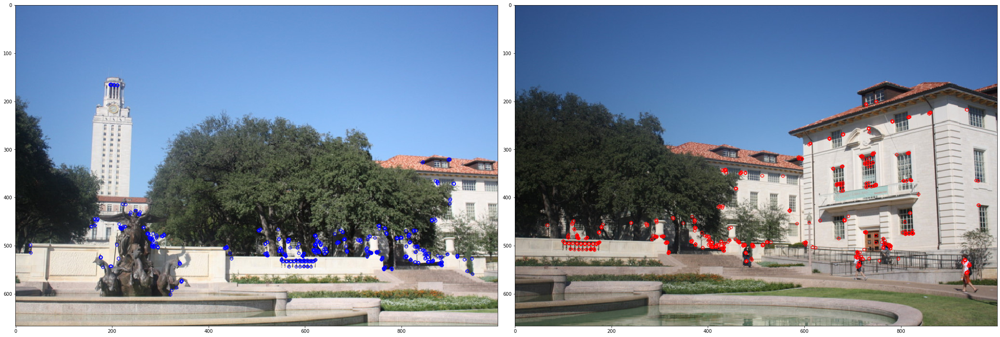

In [36]:
# Visualizing the keypoints from Left & Right images
plt.figure(figsize=(30,20))
plt.subplot(1,2,1)
plt.imshow(fixColor(img_left_kp ))

plt.subplot(1,2,2)
plt.imshow(fixColor(img_right_kp ))
plt.tight_layout()

In [40]:
# Matching the descriptor of first set with the second set using distance calculation
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

In [41]:
# Pass the 2 Images as input arguements
matches = bf.match(des1,des2)

In [42]:
# Sort the matches in the order of their distances
matches = sorted(matches, key = lambda x:x.distance)

In [47]:
# Assign color to be used to draw the matches , we use yellow here
draw_params = dict(matchColor = (255,255,0), # draw matches in yellow color
           flags = 2)

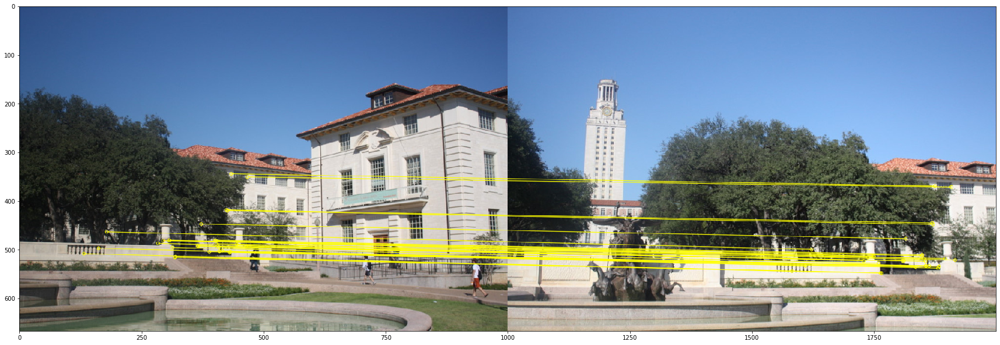

In [48]:
# Displaying the image with 30 keypoints matched between both of the images
matched_features_image = cv2.drawMatches(fixColor(img_right), kp1, fixColor(img_left), kp2, matches[:30], None,**draw_params)

plt.figure(figsize=(30,20))
plt.imshow(matched_features_image)

In [51]:
# Get the best matches between both of the images
if len(matches) >= 4:
    src = np.float32([ kp1[m.queryIdx].pt for m in matches ]).reshape(-1,1,2)
    dst = np.float32([ kp2[m.trainIdx].pt for m in matches ]).reshape(-1,1,2)

    H, masked = cv2.findHomography(src, dst, cv2.RANSAC, 5.0)
else:
    raise AssertionError("Can't find enough keypoints.")

In [56]:
# Apply perspective transformation of "Right image" (Homography matrix, size)
dst = cv2.warpPerspective(img_right,H,(img_left.shape[1] + img_right.shape[1], img_left.shape[0]))

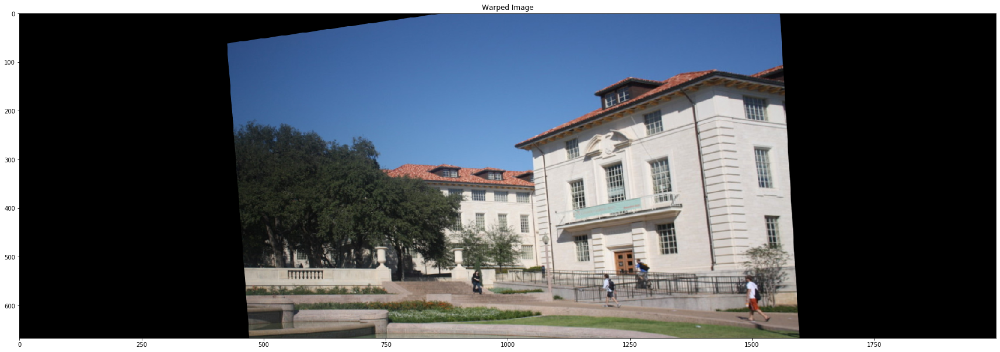

In [57]:
# Visualize the output from the transformation
plt.figure(figsize=(30,20))
plt.title('Warped Image') 
plt.imshow(fixColor(dst))

In [60]:
#  Using left- image width and right- image width in the "Left Image"
dst[0:img_left.shape[0], 0:img_left.shape[1]] = img_left

In [61]:
# Store the resultant stitched Image
cv2.imwrite('resultant_stitched_panorama.jpg',dst)

True

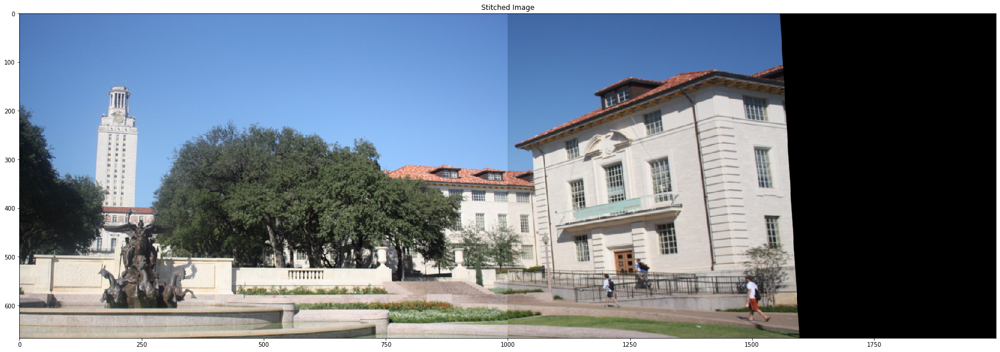

In [62]:
# Display the stitched image of the Left and Right images
plt.figure(figsize=(30,20))
plt.title('Stitched Image')
plt.imshow(fixColor(dst))